In [141]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import multivariate_normal, norm
import cv2
import ast
from scipy.signal import find_peaks
from scipy.cluster.hierarchy import dendrogram, linkage

In [142]:
class KDE:
    def __init__(self):
        self.data = None
        self.kernel = None
        self.bandwidth = None
        self.n = None
        self.d = None
        self.h = None
        self.x = None
        self.y = None
        self.z = None
        self.pseudo_likelihoods = []

    def fit(self, data, kernel, bandwidth):
        self.data = data
        self.kernel = kernel
        self.n = data.shape[0]
        self.d = data.shape[1]
        
        if bandwidth is not None:
            self.bandwidth = bandwidth
        else:
            self.bandwidth = self.select_bandwidth(data, kernel)
       
        self.h = self.bandwidth * (4 / (3 * self.n)) ** (1 / 5)

    def evaluate(self, x):
        if self.kernel == 'box':
            if self.d == 1:
                return self.box(x)
            return np.prod(self.box(x), axis=1)
        
        elif self.kernel == 'gaussian':
            if self.d == 1:
                return self.gaussian(x)
            return np.prod(self.gaussian(x), axis=1)
        
        elif self.kernel == 'triangular':
            if self.d == 1:
                return self.triangular(x)
            return np.prod(self.triangular(x), axis=1)
        
    def box(self, x):
        return np.where(np.abs(x) <= 1, 0.5, 0)
    
    def gaussian(self, x):
        return norm.pdf(x)
    
    def triangular(self, x):
        return np.where(np.abs(x) <= 1, 1 - np.abs(x), 0)
    
    def visualize(self):
        if self.d == 1:
            self.x = np.linspace(self.data.min() - 3 * self.h, self.data.max() + 3 * self.h, 1000)
            self.z = np.zeros(self.x.shape)

            for i in range(self.n):
                self.z += self.evaluate((self.x - self.data[i]) / self.bandwidth)
            self.z /= self.n * self.bandwidth
            
            plt.figure(figsize=(10, 5))
            plt.plot(self.x, self.z, label='Bandwidth = {}'.format(self.bandwidth))
            plt.hist(self.data, bins=20, density=True, alpha=0.5, label='data')
            plt.legend()
            plt.show()

        elif self.d == 2:
            self.x = np.linspace(self.data[:, 0].min() - 3 * self.h, self.data[:, 0].max() + 3 * self.h, 100)
            self.y = np.linspace(self.data[:, 1].min() - 3 * self.h, self.data[:, 1].max() + 3 * self.h, 100)
            self.x, self.y = np.meshgrid(self.x, self.y)
            self.z = np.zeros(self.x.shape)

            for i in range(self.n):
                diff = np.stack([self.x, self.y], axis=2) - np.broadcast_to(self.data[i].reshape(1, 1, 2), (100, 100, 2))
                diff = diff.reshape(-1, 2)  
                self.z += self.evaluate(diff / self.bandwidth).reshape(self.x.shape)
            self.z /= self.n * self.bandwidth ** 2

            plt.figure(figsize=(10, 5))
            plt.contourf(self.x, self.y, self.z, cmap='Blues')
            plt.scatter(self.data[:, 0], self.data[:, 1], color='black', alpha=0.5)
            plt.show()

        else:
            print('Visualization is not supported for d > 2.')

    def select_bandwidth(self, data, kernel):
        bandwidths = np.linspace(0.1, 10, 100)
        pseudo_likelihoods = []

        for bandwidth in bandwidths:
            pseudo_likelihoods.append(self.pseudo_likelihood(data, kernel, bandwidth))
        return bandwidths[np.argmax(pseudo_likelihoods)]
    
    def pseudo_likelihood(self, data, kernel, bandwidth):
        pseudo_likelihood = 0
        for i in range(self.n):
            data_without_i = np.delete(data, i, axis=0)
            pseudo_likelihood += np.log((self.evaluate((data[i] - data_without_i) / bandwidth).mean() + 1e-10) / bandwidth)
        return pseudo_likelihood

    def threshold(self, data, kernel, bandwidth):
        x = np.linspace(data.min() - 3 * bandwidth, data.max() + 3 * bandwidth, 1000)
        z = np.zeros(x.shape)
        for i in range(self.n):
            z += self.evaluate((x - data[i]) / bandwidth)
        z /= self.n * bandwidth

        peaks, _ = find_peaks(z, distance=50)
        peaks = sorted(peaks, key=lambda x: z[x], reverse=True)
        return x[int((peaks[0] + peaks[1]) / 2)]

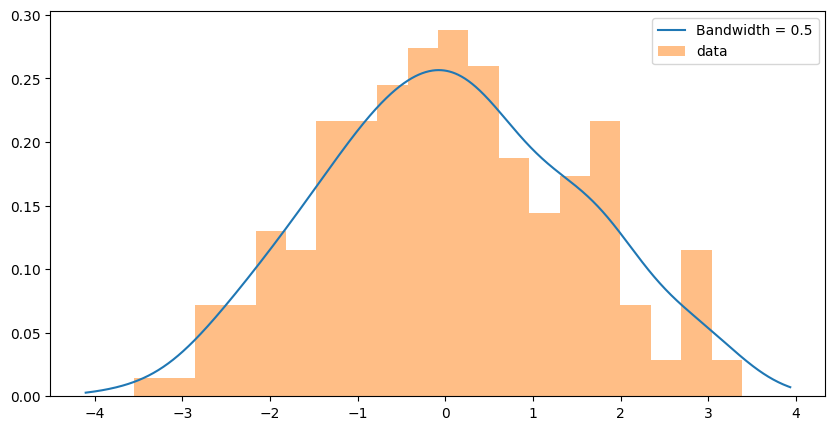

In [143]:
np.random.seed(0)
data = np.concatenate([np.random.normal(-1, 1, 100), np.random.normal(1, 1, 100)])
data = data.reshape(-1, 1)
np.random.shuffle(data)

kde = KDE()
kde.fit(data, kernel='gaussian', bandwidth=None)    
kde.visualize()

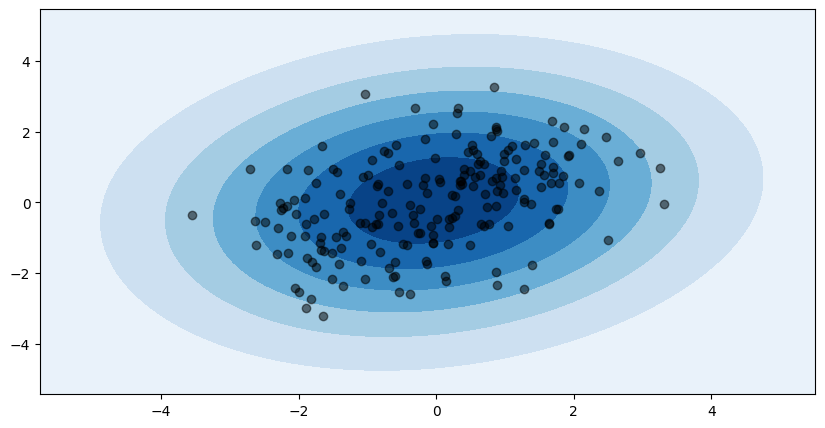

In [144]:
np.random.seed(0)
data = np.concatenate([np.random.multivariate_normal([-1, -1], [[1, 0], [0, 1]], 100), np.random.multivariate_normal([1, 1], [[1, 0], [0, 1]], 100)])
np.random.shuffle(data)

kde = KDE()
kde.fit(data, kernel='gaussian', bandwidth=None)
kde.visualize()

In [145]:
def get_box(df):
  top_left = [ast.literal_eval(i) for i in df['Top-Left']]
  bottom_right = [ast.literal_eval(i) for i in df['Bottom-Right']]

  top = [i[1] for i in top_left]
  bottom = [i[1] for i in bottom_right]
  right = [i[0] for i in bottom_right]
  left = [i[0] for i in top_left]

  df['Top'] = [[(left[i] + right[i])/2, top[i]] for i in range(len(df))]
  df['Bottom'] = [[(left[i] + right[i])/2, bottom[i]] for i in range(len(df))]
  df['Right'] = [[right[i], (top[i] + bottom[i])/2] for i in range(len(df))]
  df['Left'] = [[left[i], (top[i] + bottom[i])/2] for i in range(len(df))]

  top_distance = []
  for i in range(len(df)):
    min_distance = 100000000
    id = i
    for j in range(len(df)):
      if i != j:
          distance = np.sqrt((df['Top'][i][0] - df['Bottom'][j][0])**2 + (df['Top'][i][1] - df['Bottom'][j][1])**2)
          if distance < min_distance:
              min_distance = distance
              id = j

    top_distance.append([min_distance, id])

  df['Top_Box'] = top_distance

  bottom_distance = []
  for i in range(len(df)):
    min_distance = 100000000
    id = i
    for j in range(len(df)):
      if i != j:
          distance = np.sqrt((df['Bottom'][i][0] - df['Top'][j][0])**2 + (df['Bottom'][i][1] - df['Top'][j][1])**2)
          if distance < min_distance:
              min_distance = distance
              id = j

    bottom_distance.append([min_distance, id])

  df['Bottom_Box'] = bottom_distance

  right_distance = []
  for i in range(len(df)):
    min_distance = 100000000
    id = i
    for j in range(len(df)):
      if i != j:
          distance = np.sqrt((df['Right'][i][0] - df['Left'][j][0])**2 + (df['Right'][i][1] - df['Left'][j][1])**2)
          if distance < min_distance:
              min_distance = distance
              id = j

    right_distance.append([min_distance, id])

  df['Right_Box'] = right_distance

  left_distance = []
  for i in range(len(df)):
    min_distance = 100000000
    id = i
    for j in range(len(df)):
      if i != j:
          distance = np.sqrt((df['Left'][i][0] - df['Right'][j][0])**2 + (df['Left'][i][1] - df['Right'][j][1])**2)
          if distance < min_distance:
              min_distance = distance
              id = j

    left_distance.append([min_distance, id])

  df['Left_Box'] = left_distance

  df['Center'] = [[(df['Top'][i][0] + df['Bottom'][i][0])/2, (df['Top'][i][1] + df['Bottom'][i][1])/2] for i in range(len(df))]
  return df

In [146]:
def get_threshold(df, h): 
  horizontal_distance = []
  vertical_distance = []
  for i in range(len(df)):
    horizontal_distance.append(df['Left_Box'][i][0])
    horizontal_distance.append(df['Right_Box'][i][0])

    vertical_distance.append(df['Top_Box'][i][0])
    vertical_distance.append(df['Bottom_Box'][i][0])

  horizontal_distance = np.array(horizontal_distance).reshape(-1, 1)
  vertical_distance = np.array(vertical_distance).reshape(-1, 1)

  print("Horizontal Distance: ")
  horizontal_kde = KDE()
  horizontal_kde.fit(horizontal_distance, kernel='gaussian', bandwidth=h)
  horizontal_kde.visualize()

  print("Vertical Distance: ")
  vertical_kde = KDE()
  vertical_kde.fit(vertical_distance, kernel='gaussian', bandwidth=h)
  vertical_kde.visualize()

  horizontal_threshold = horizontal_kde.threshold(horizontal_distance, kernel='gaussian', bandwidth=horizontal_kde.bandwidth)
  vertical_threshold = vertical_kde.threshold(vertical_distance, kernel='gaussian', bandwidth=vertical_kde.bandwidth)

  print("Horizontal Threshold: ", horizontal_threshold)
  print("Vertical Threshold: ", vertical_threshold)

  euclidean = df.copy()

  for i in range(len(df)):
    if df['Top_Box'][i][0] > vertical_threshold:
      euclidean['Top_Box'][i][1] = 0
    if df['Bottom_Box'][i][0] > vertical_threshold:
      euclidean['Bottom_Box'][i][1] = 0
    if df['Right_Box'][i][0] > horizontal_threshold:
      euclidean['Right_Box'][i][1] = 0
    if df['Left_Box'][i][0] > horizontal_threshold:
      euclidean['Left_Box'][i][1] = 0

  return euclidean

In [147]:
def visualize_bboxes(img):
  img_2 = img.copy()
  for index, rows in df.iterrows():
    top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
    bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
    #print(top_left)
    cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)

  plt.imshow(img_2)

In [148]:
def make_connections(image, euclidean):

  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  image_with_boxes = image_rgb.copy()

  for index, row in euclidean.iterrows():
      left = int(row['Left'][0])
      right = int(row['Right'][0])
      top = int(row['Top'][1])
      bottom = int(row['Bottom'][1])
      box_id = int(row['Id'])

      width = right - left
      height = bottom - top

      top_left = (left, top)
      bottom_right = (right, bottom)

      cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

    #   label_position = (left, top - 10)
    #   cv2.putText(image_with_boxes, str(box_id), label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

      top_adjacent_id = int(row['Top_Box'][1])
      bottom_adjacent_id = int(row['Bottom_Box'][1])
      left_adjacent_id = int(row['Left_Box'][1])
      right_adjacent_id = int(row['Right_Box'][1])

      if top_adjacent_id != 0:
          top_adjacent_row = euclidean[euclidean['Id'] == top_adjacent_id].iloc[0]
          top_adjacent_center = int(top_adjacent_row['Bottom'][0]) , int(top_adjacent_row['Bottom'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(top)), top_adjacent_center, (0, 255, 0), 2)

      if bottom_adjacent_id != 0:
          bottom_adjacent_row = euclidean[euclidean['Id'] == bottom_adjacent_id].iloc[0]
          bottom_adjacent_center = int(bottom_adjacent_row['Top'][0]) , int(bottom_adjacent_row['Top'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(bottom)), (int(bottom_adjacent_center[0]), int(bottom_adjacent_center[1])), (0, 255, 0), 2)

      if left_adjacent_id != 0:
          left_adjacent_row = euclidean[euclidean['Id'] == left_adjacent_id].iloc[0]
          left_adjacent_center = int(left_adjacent_row['Right'][0]) , int(left_adjacent_row['Right'][1])
          cv2.line(image_with_boxes, (int(left), int(top) + height // 2), (int(left_adjacent_center[0]), int(left_adjacent_center[1])), (0, 255, 0), 2)

      if right_adjacent_id != 0:
          right_adjacent_row = euclidean[euclidean['Id'] == right_adjacent_id].iloc[0]
          right_adjacent_center = int(right_adjacent_row['Left'][0]) , int(right_adjacent_row['Left'][1])
          cv2.line(image_with_boxes, (int(right), int(top) + height // 2), (int(right_adjacent_center[0]), int(right_adjacent_center[1])), (0, 255, 0), 2)

  return image_with_boxes

Horizontal Distance: 


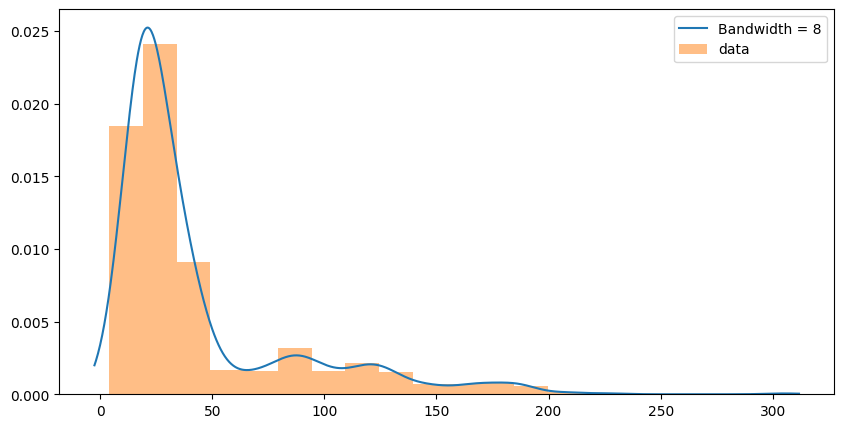

Vertical Distance: 


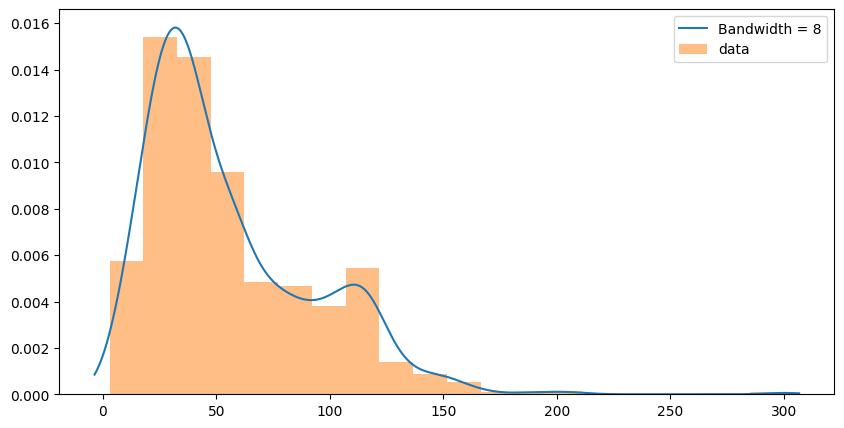

Horizontal Threshold:  54.11580108033645
Vertical Threshold:  71.26119928875508


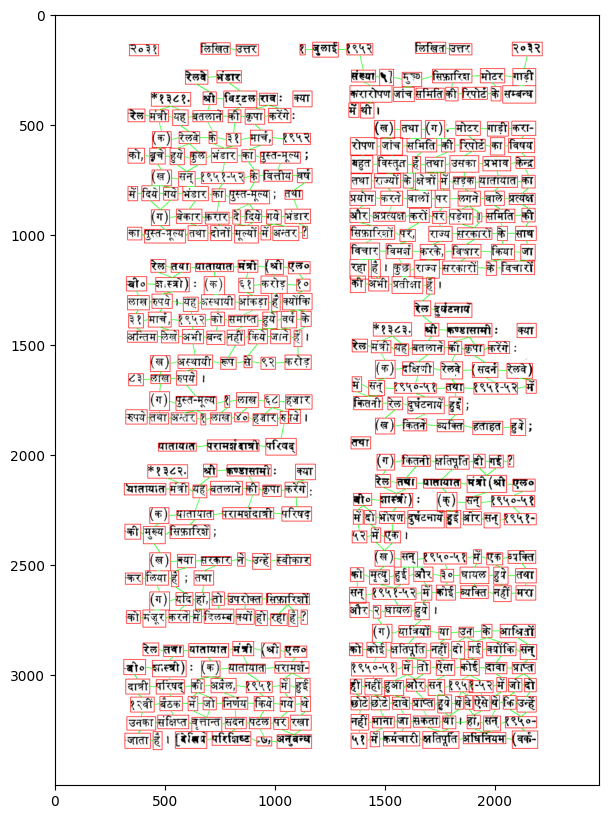

In [149]:
img = cv2.imread('images/29.jpg')
df = pd.read_csv('CSV/TLBR_29.csv')
df = get_box(df)
euclidean = get_threshold(df, 8)
image_with_boxes = make_connections(img, euclidean)
plt.figure(figsize=(10, 10))
plt.imshow(image_with_boxes)

Horizontal Distance: 


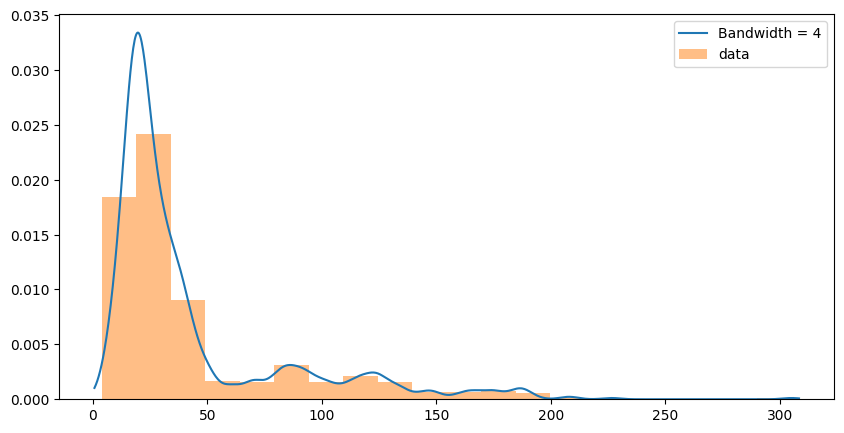

Vertical Distance: 


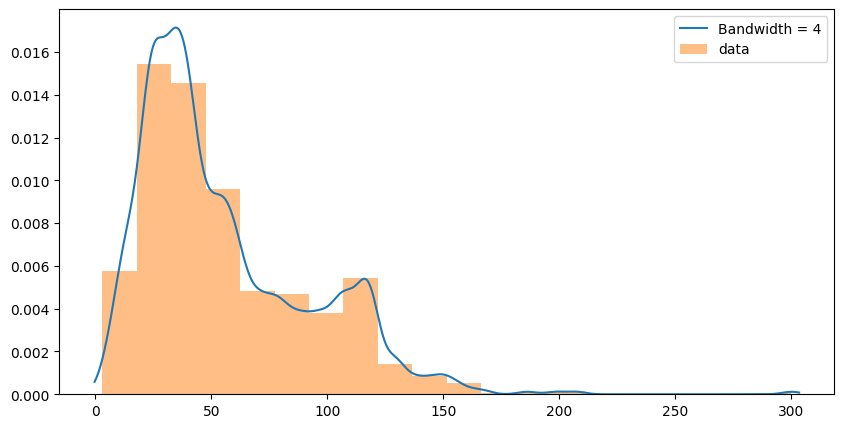

Horizontal Threshold:  52.88690856352944
Vertical Threshold:  75.23916718006461


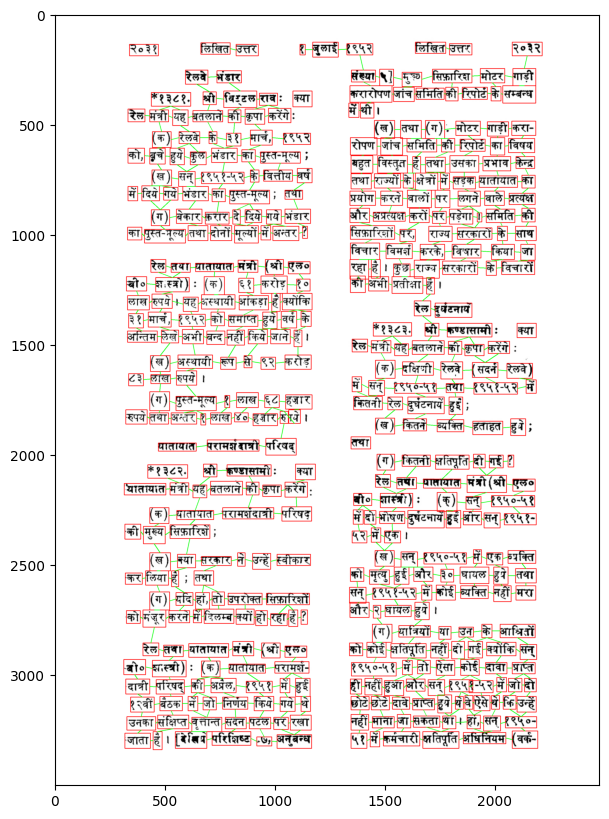

In [150]:
img = cv2.imread('images/29.jpg')
df = pd.read_csv('CSV/TLBR_29.csv')
df = get_box(df)
euclidean = get_threshold(df, 4)
image_with_boxes = make_connections(img, euclidean)
plt.figure(figsize=(10, 10))
plt.imshow(image_with_boxes)

Horizontal Distance: 


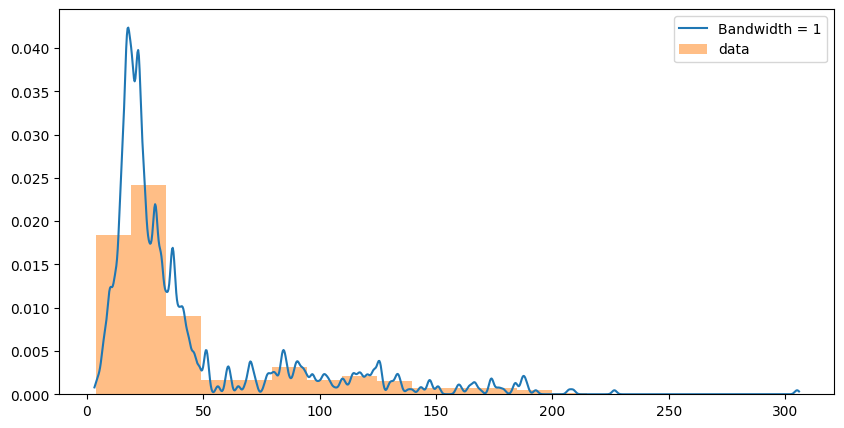

Vertical Distance: 


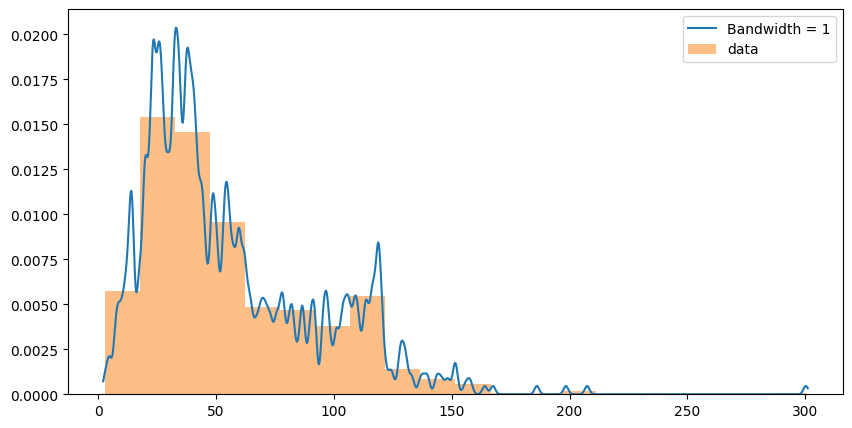

Horizontal Threshold:  27.161315383245093
Vertical Threshold:  43.70479500055543


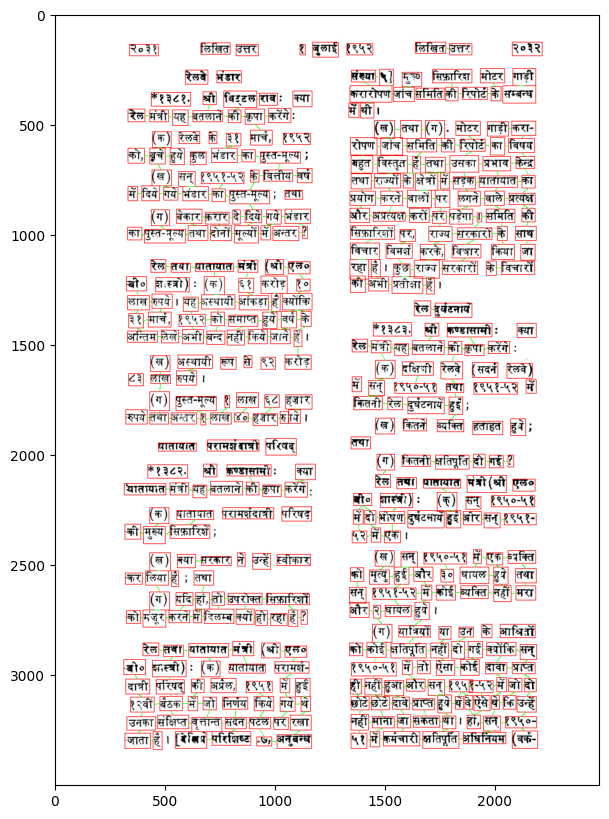

In [151]:
img = cv2.imread('images/29.jpg')
df = pd.read_csv('CSV/TLBR_29.csv')
df = get_box(df)
euclidean = get_threshold(df, 1)
image_with_boxes = make_connections(img, euclidean)
plt.figure(figsize=(10, 10))
plt.imshow(image_with_boxes)

Horizontal Distance: 


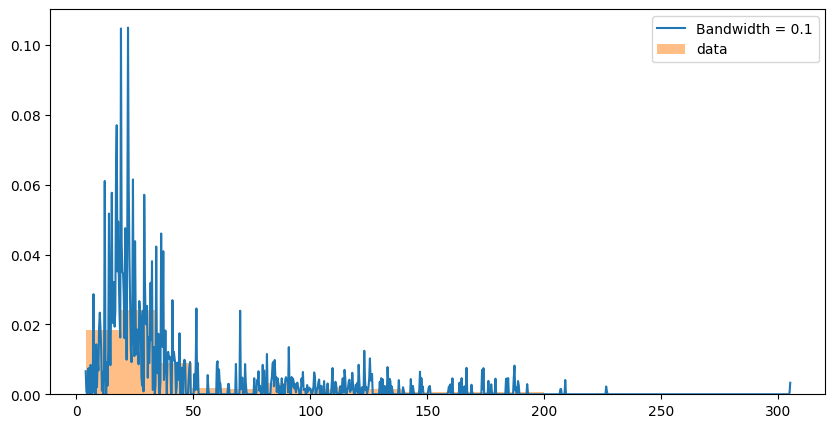

Vertical Distance: 


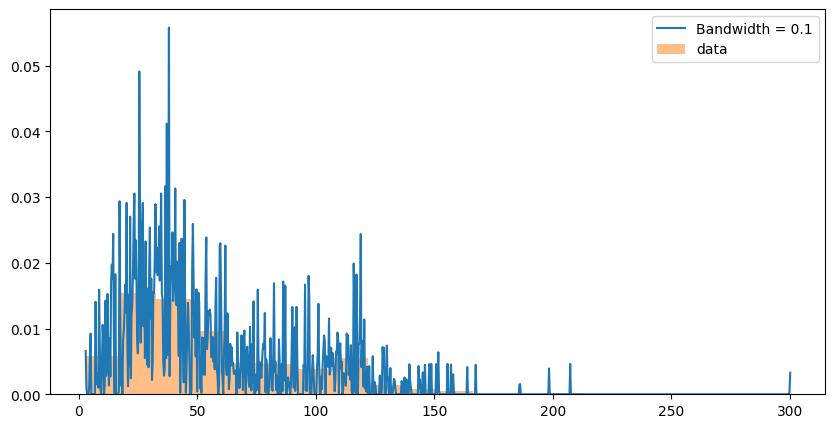

Horizontal Threshold:  26.985787495584564
Vertical Threshold:  24.759408541952094


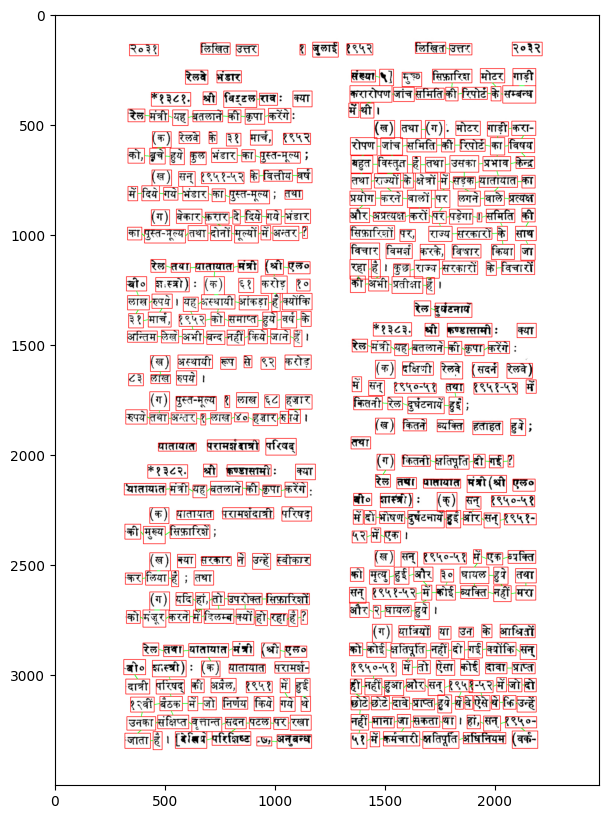

In [152]:
img = cv2.imread('images/29.jpg')
df = pd.read_csv('CSV/TLBR_29.csv')
df = get_box(df)
euclidean = get_threshold(df, 0.1)
image_with_boxes = make_connections(img, euclidean)
plt.figure(figsize=(10, 10))
plt.imshow(image_with_boxes)

In [153]:
def plot_dendogram(df):
    center = []
    for index, row in df.iterrows():
        center.append(row['Center'])

    center = np.array(center)

    linked = linkage(center, 'single')
    plt.figure(figsize=(30, 20))
    dendrogram(linked,
                orientation='top',
                distance_sort='descending',
                show_leaf_counts=True)
    plt.show()

def set_threshold(df, threshold):
    euclidean = df.copy()

    for i in range(len(df)):
        if df['Top_Box'][i][0] > threshold:
            euclidean['Top_Box'][i][1] = 0
        if df['Bottom_Box'][i][0] > threshold:
            euclidean['Bottom_Box'][i][1] = 0
        if df['Right_Box'][i][0] > threshold:
            euclidean['Right_Box'][i][1] = 0
        if df['Left_Box'][i][0] > threshold:
            euclidean['Left_Box'][i][1] = 0

    return euclidean

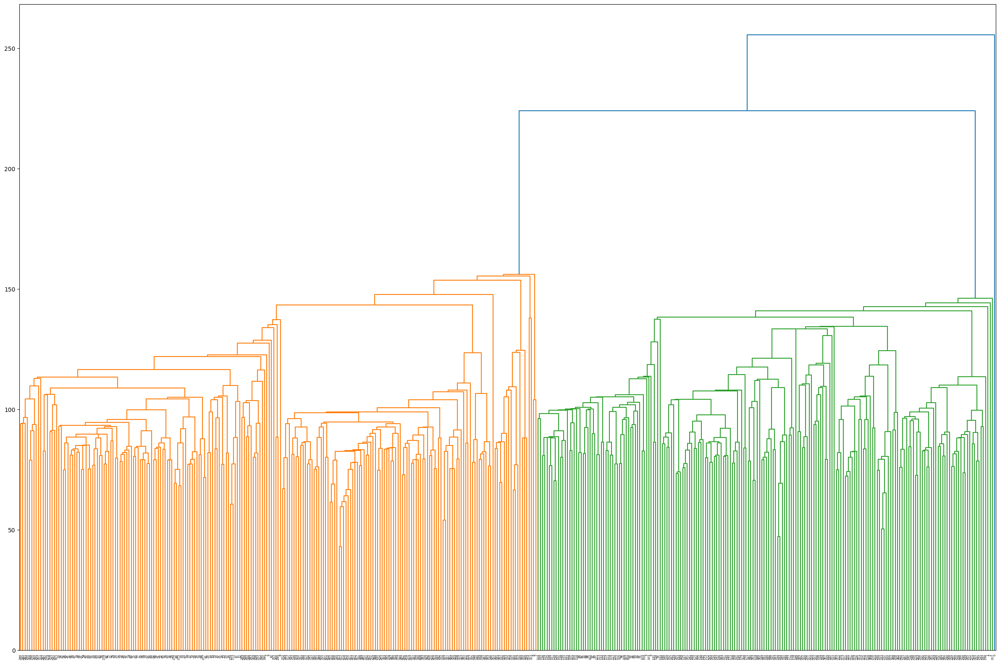

In [154]:
img = cv2.imread('images/29.jpg')
df = pd.read_csv('CSV/TLBR_29.csv')
df = get_box(df)
plot_dendogram(df)

Horizontal Distance: 


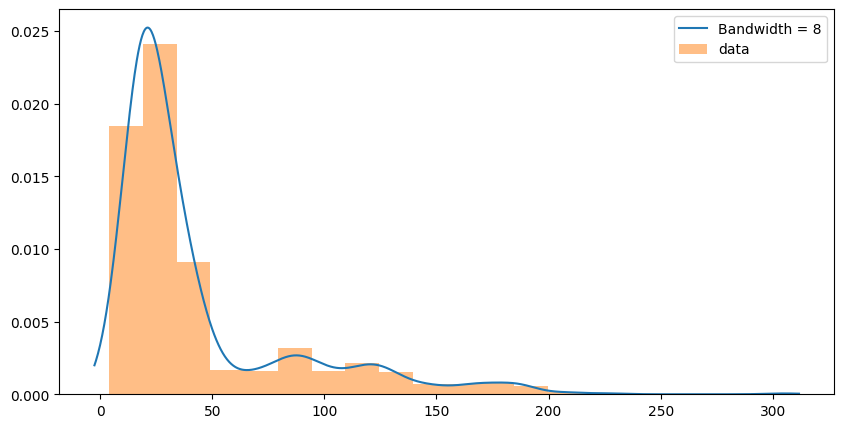

Vertical Distance: 


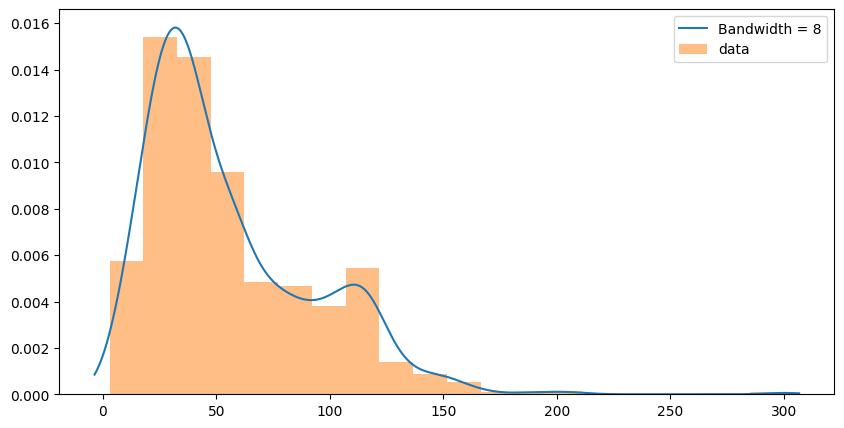

Horizontal Threshold:  54.11580108033645
Vertical Threshold:  71.26119928875508


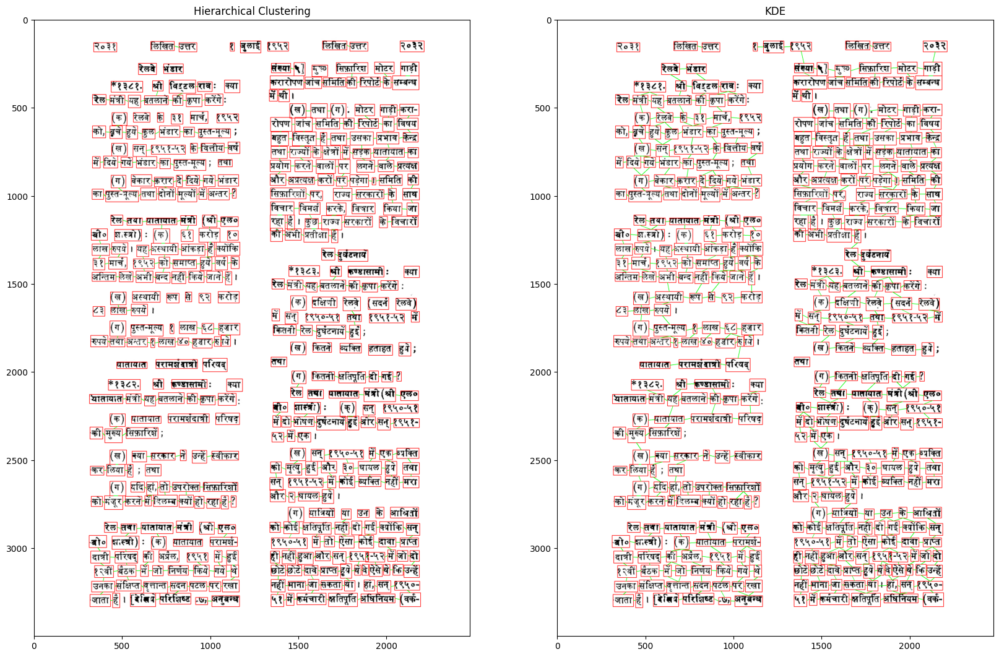

In [156]:
euclidean = set_threshold(df, 30)
image_with_boxes1 = make_connections(img, euclidean)

df = pd.read_csv('CSV/TLBR_29.csv')
df = get_box(df)
euclidean = get_threshold(df, 8)
image_with_boxes2 = make_connections(img, euclidean)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(image_with_boxes1)
plt.title('Hierarchical Clustering')
plt.subplot(1, 2, 2)
plt.imshow(image_with_boxes2)
plt.title('KDE')
plt.show()

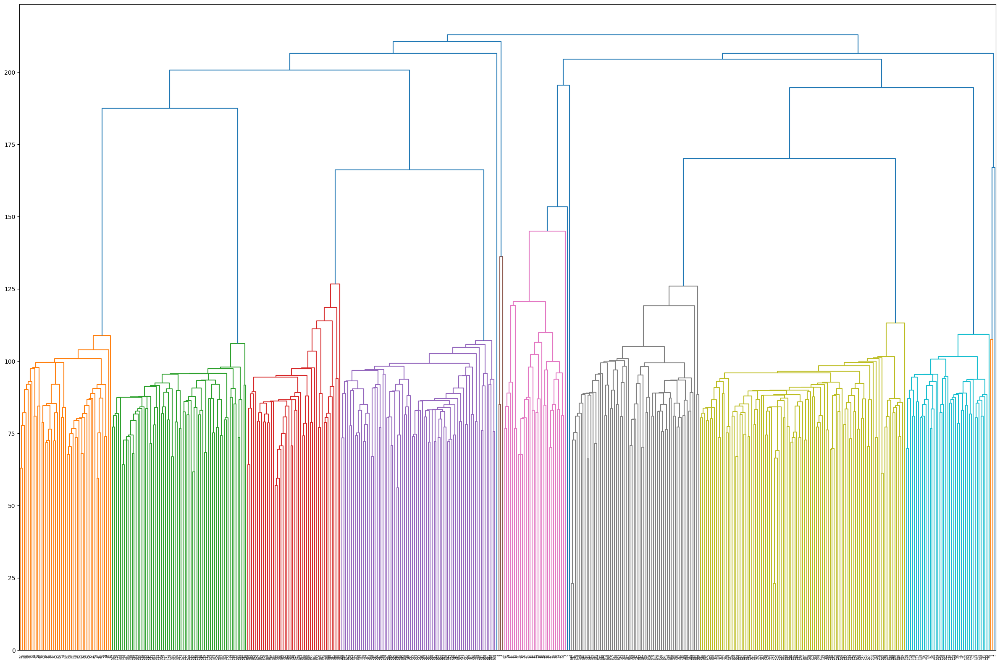

In [157]:
img = cv2.imread('images/68.jpg')
df = pd.read_csv('CSV/TLBR_68.csv')
df = get_box(df)
plot_dendogram(df)

Horizontal Distance: 


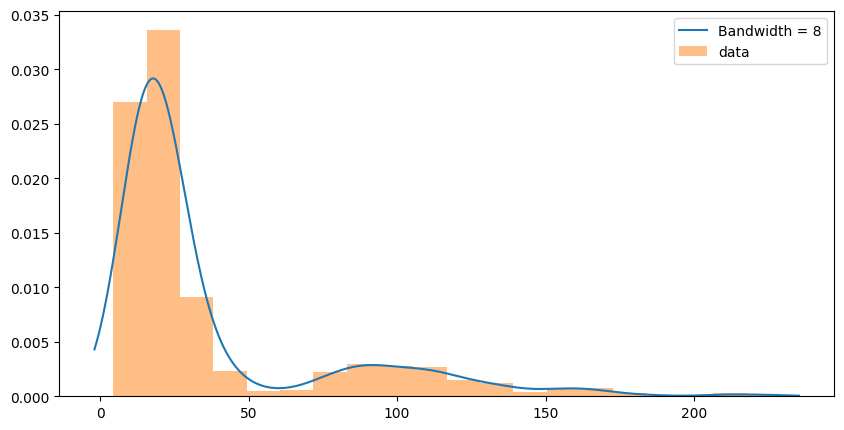

Vertical Distance: 


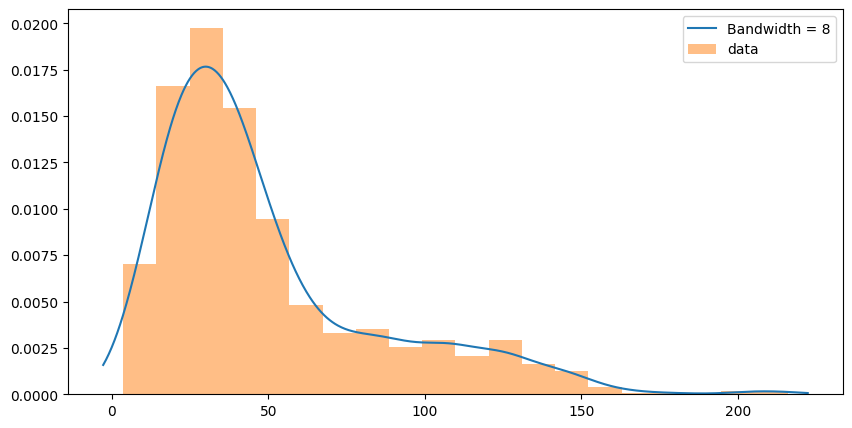

Horizontal Threshold:  54.66678257656542
Vertical Threshold:  119.26482254348866


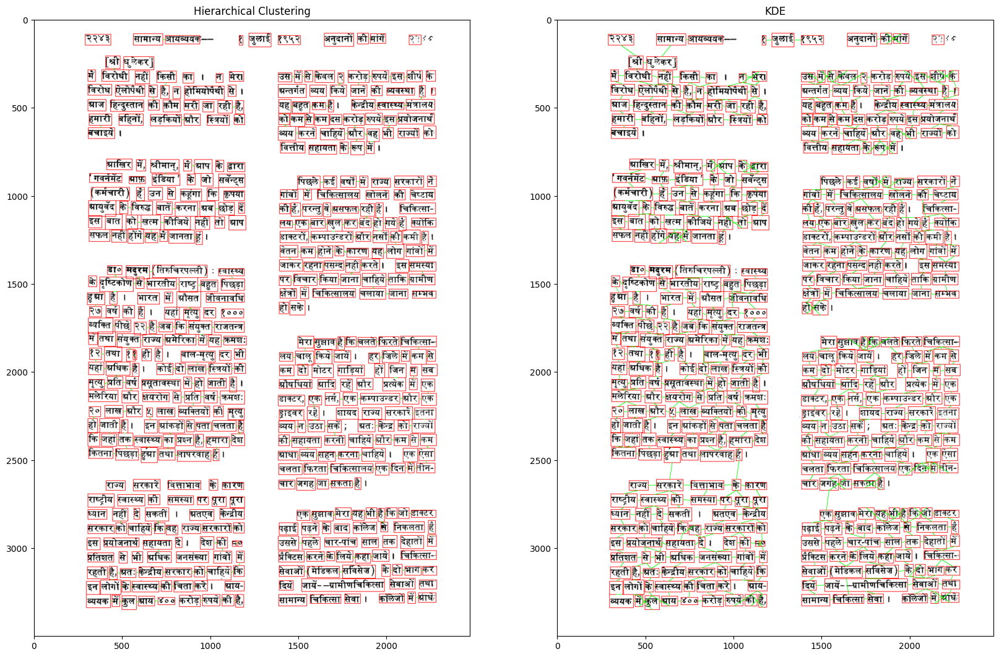

In [158]:
euclidean = set_threshold(df, 20)
image_with_boxes1 = make_connections(img, euclidean)

df = pd.read_csv('CSV/TLBR_68.csv')
df = get_box(df)
euclidean = get_threshold(df, 8)
image_with_boxes2 = make_connections(img, euclidean)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(image_with_boxes1)
plt.title('Hierarchical Clustering')
plt.subplot(1, 2, 2)
plt.imshow(image_with_boxes2)
plt.title('KDE')
plt.show()

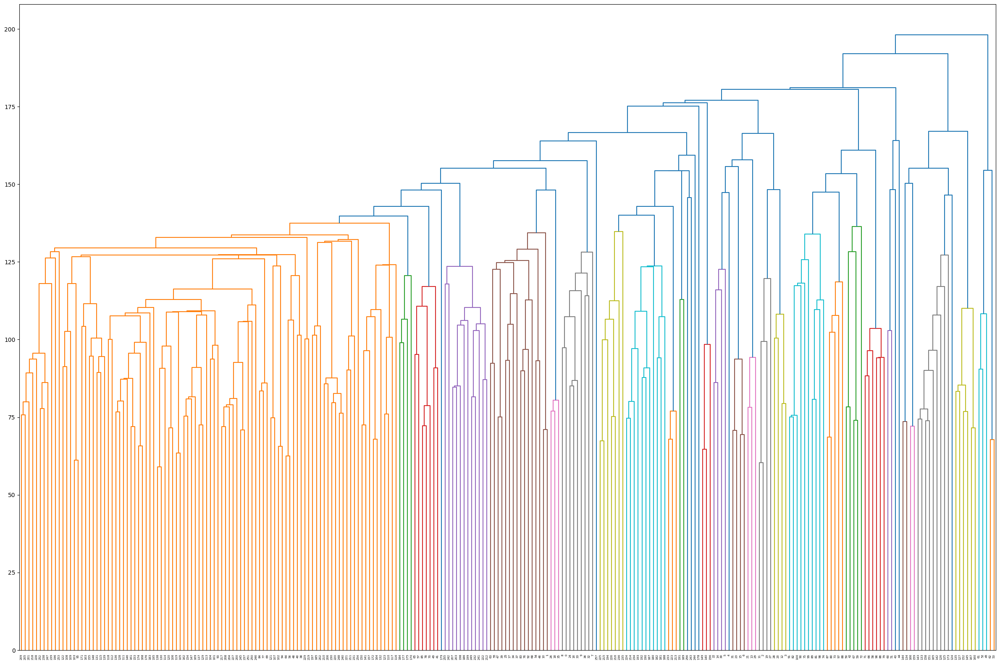

In [159]:
img = cv2.imread('images/145.jpg')
df = pd.read_csv('CSV/TLBR_145.csv')
df = get_box(df)
plot_dendogram(df)

Horizontal Distance: 


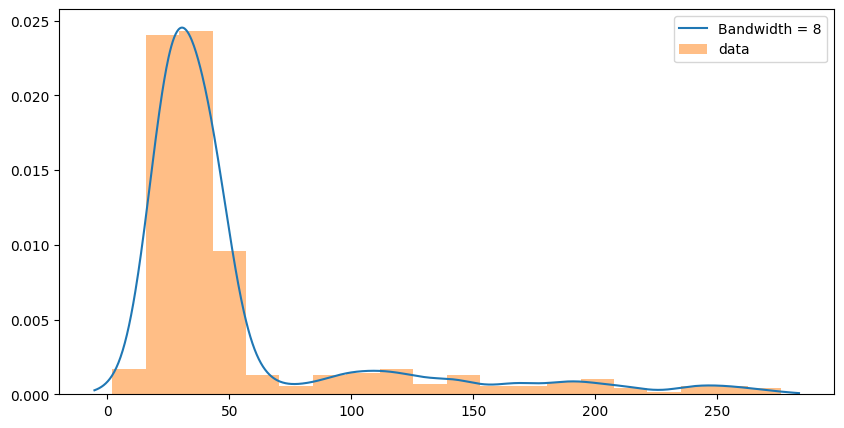

Vertical Distance: 


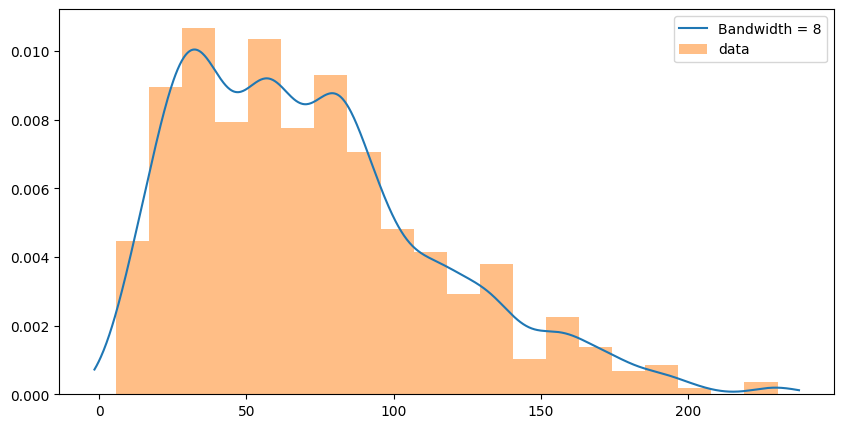

Horizontal Threshold:  69.58947939950994
Vertical Threshold:  44.47659091667511


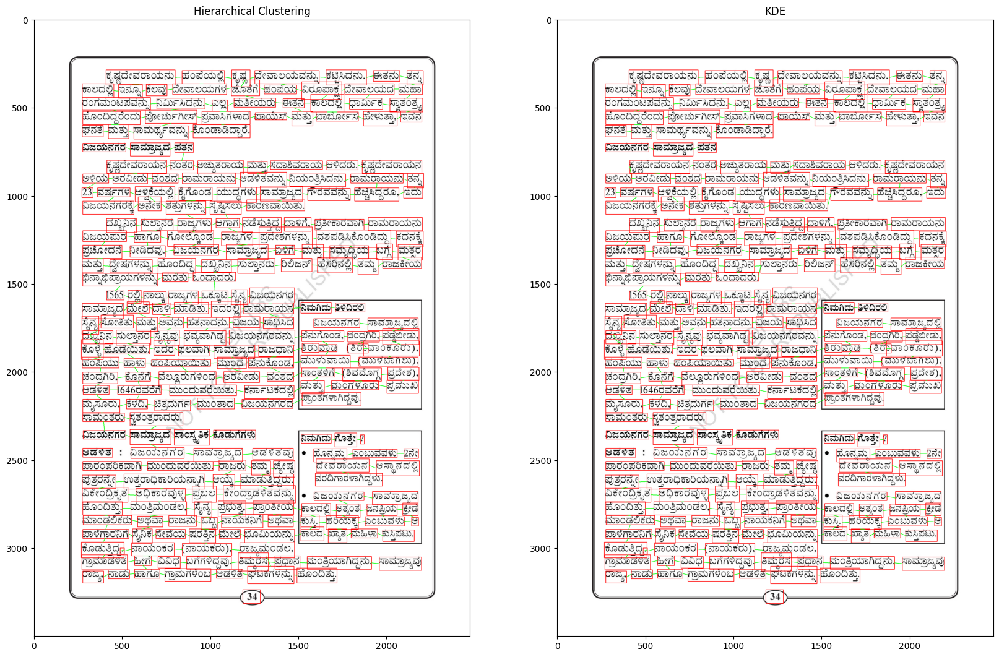

In [160]:
euclidean = set_threshold(df, 60)
image_with_boxes1 = make_connections(img, euclidean)

df = pd.read_csv('CSV/TLBR_145.csv')
df = get_box(df)
euclidean = get_threshold(df, 8)
image_with_boxes2 = make_connections(img, euclidean)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(image_with_boxes1)
plt.title('Hierarchical Clustering')
plt.subplot(1, 2, 2)
plt.imshow(image_with_boxes2)
plt.title('KDE')
plt.show()

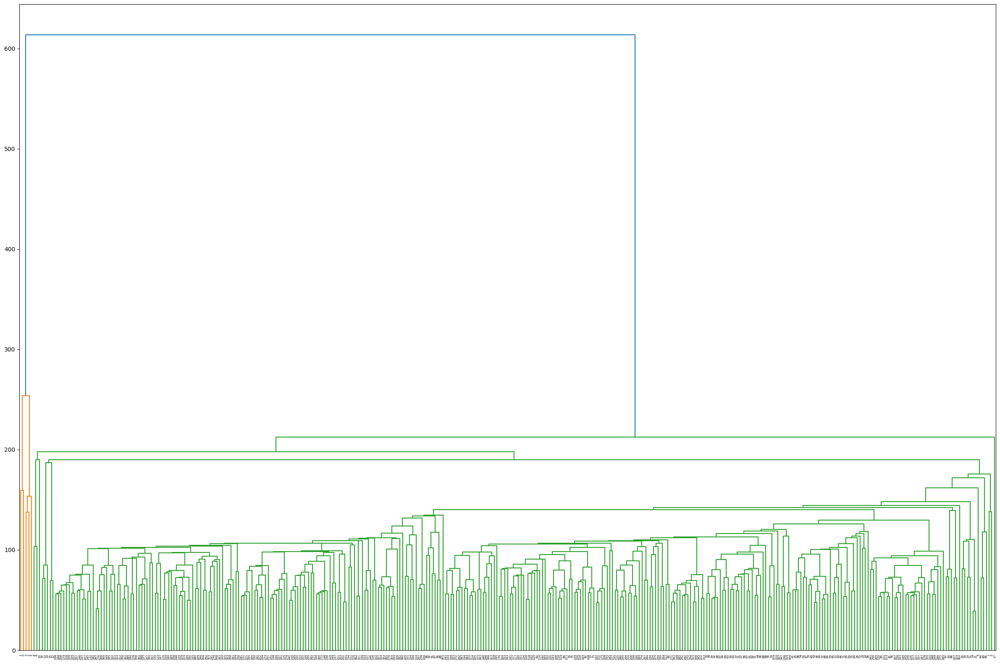

In [161]:
img = cv2.imread('images/201.jpg')
df = pd.read_csv('CSV/TLBR_201.csv')
df = get_box(df)
plot_dendogram(df)

Horizontal Distance: 


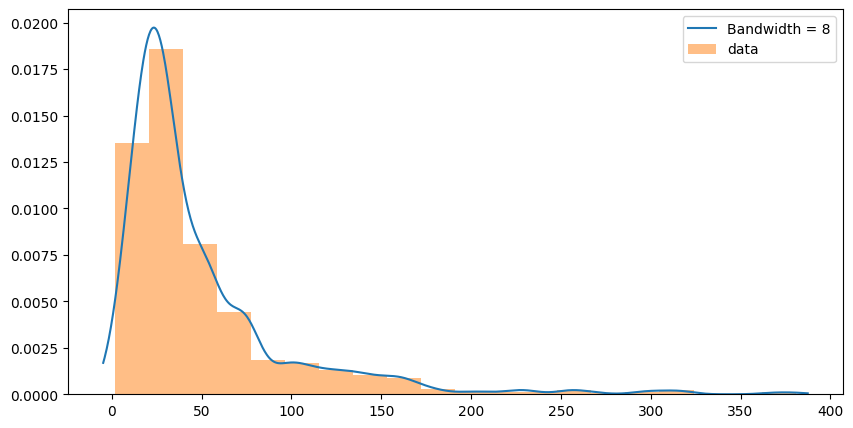

Vertical Distance: 


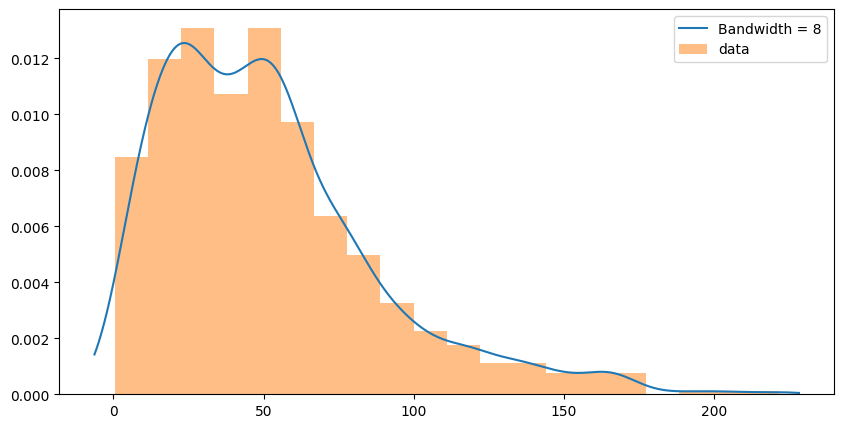

Horizontal Threshold:  62.125591121692125
Vertical Threshold:  36.24666686744568


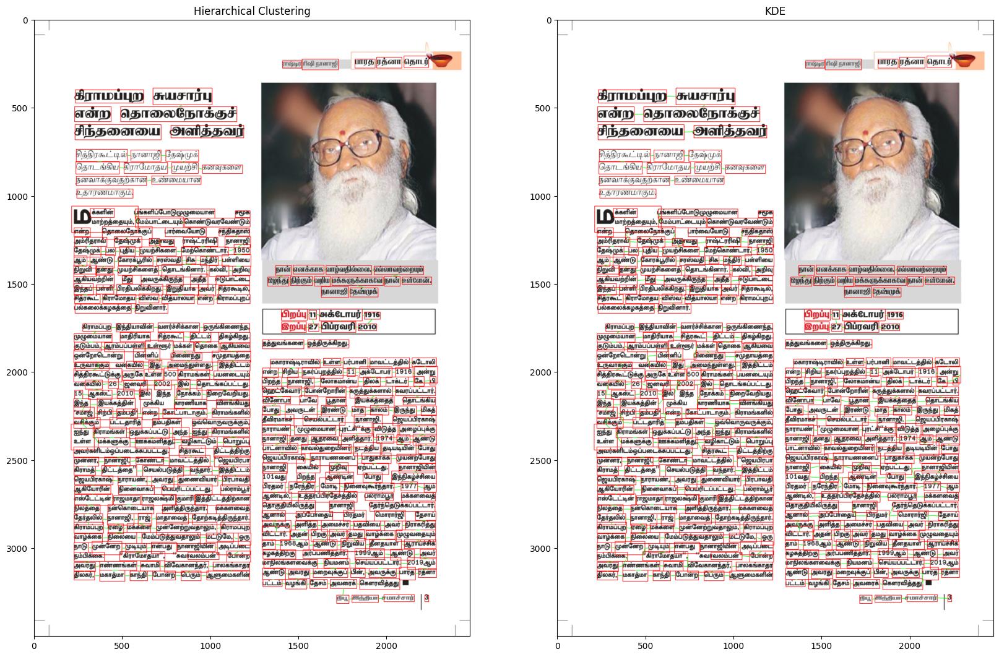

In [162]:
euclidean = set_threshold(df, 40)
image_with_boxes1 = make_connections(img, euclidean)

df = pd.read_csv('CSV/TLBR_201.csv')
df = get_box(df)
euclidean = get_threshold(df, 8)
image_with_boxes2 = make_connections(img, euclidean)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(image_with_boxes1)
plt.title('Hierarchical Clustering')
plt.subplot(1, 2, 2)
plt.imshow(image_with_boxes2)
plt.title('KDE')
plt.show()

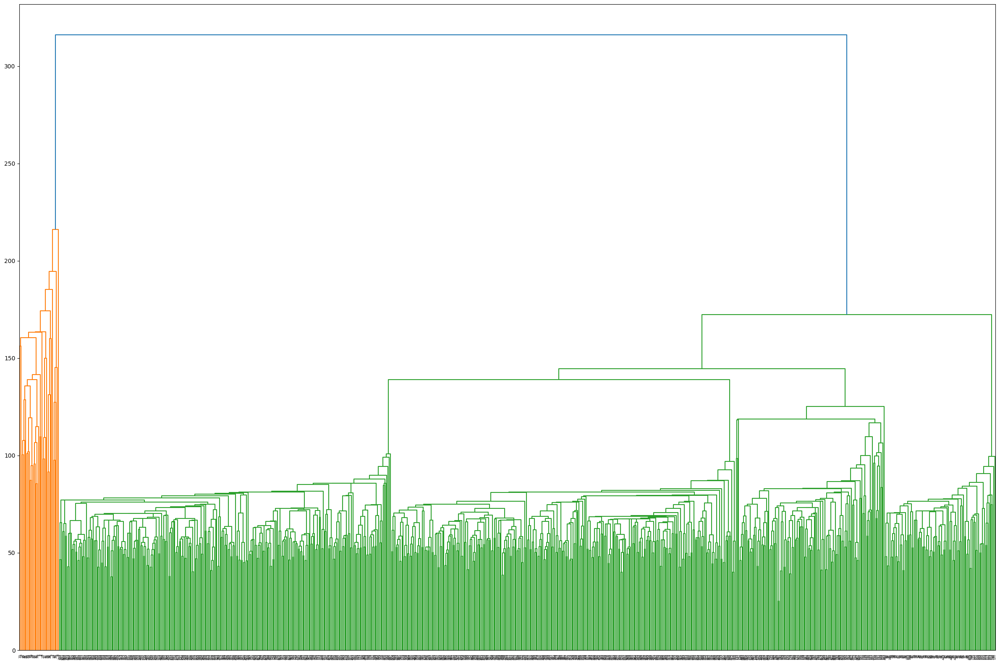

In [163]:
img = cv2.imread('images/232.jpg')
df = pd.read_csv('CSV/TLBR_232.csv')
df = get_box(df)
plot_dendogram(df)

Horizontal Distance: 


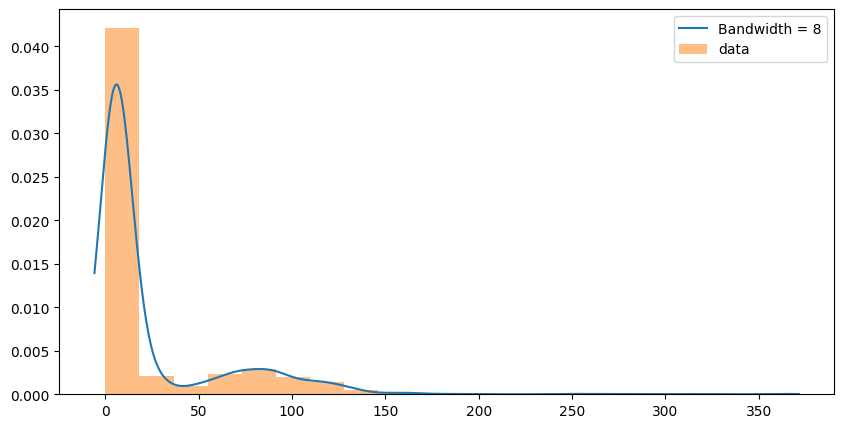

Vertical Distance: 


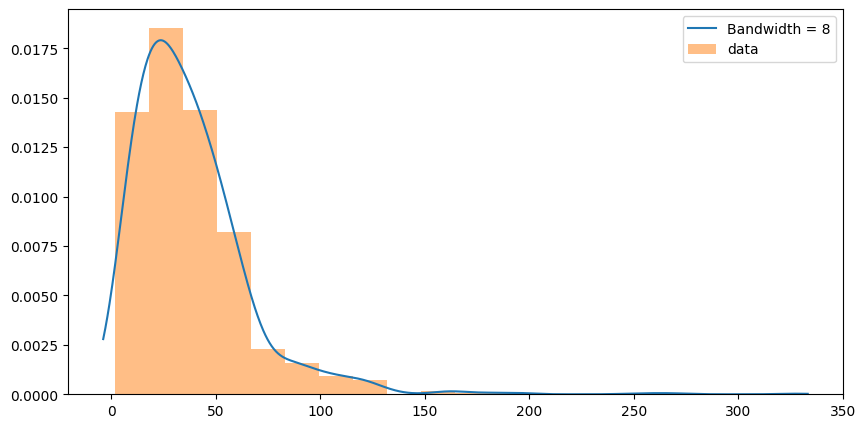

Horizontal Threshold:  44.3427738974695
Vertical Threshold:  93.13844271571864


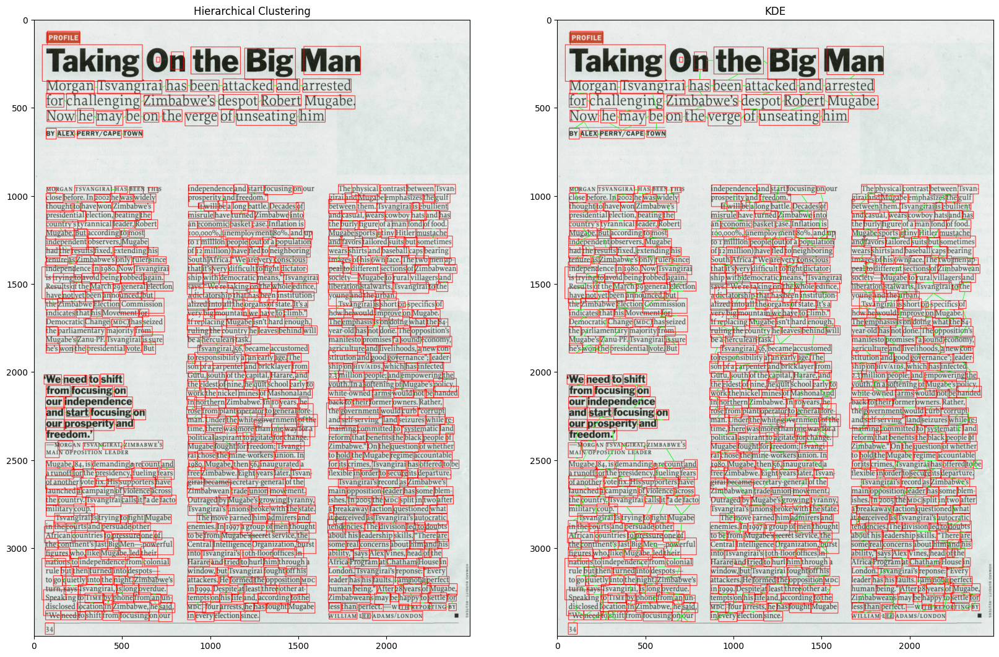

In [165]:
euclidean = set_threshold(df, 25)
image_with_boxes1 = make_connections(img, euclidean)

df = pd.read_csv('CSV/TLBR_232.csv')
df = get_box(df)
euclidean = get_threshold(df, 8)
image_with_boxes2 = make_connections(img, euclidean)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(image_with_boxes1)
plt.title('Hierarchical Clustering')
plt.subplot(1, 2, 2)
plt.imshow(image_with_boxes2)
plt.title('KDE')
plt.show()

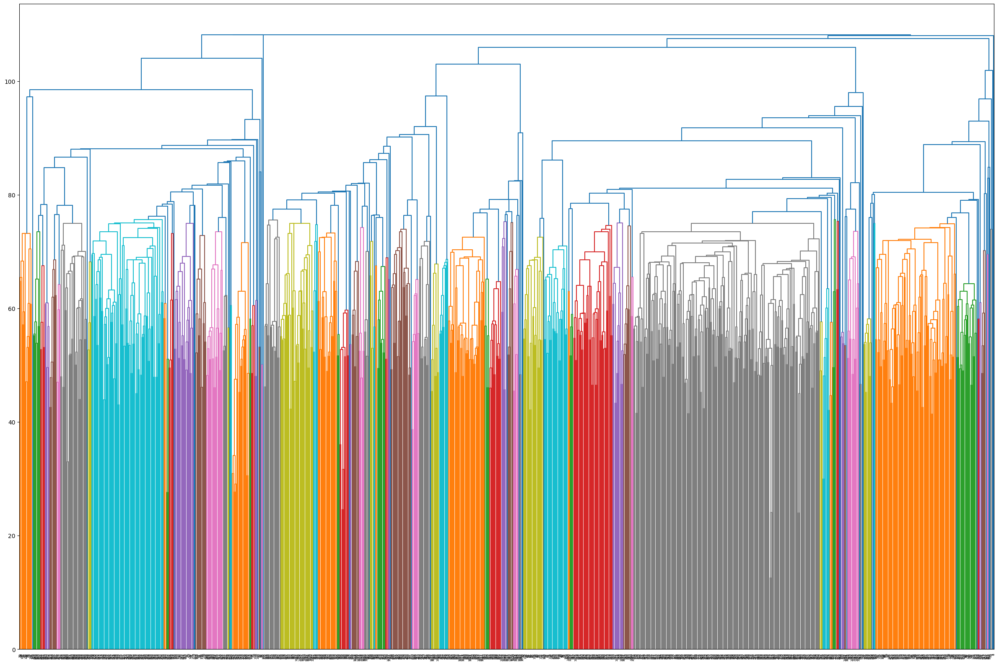

In [166]:
img = cv2.imread('images/250.jpg')
df = pd.read_csv('CSV/TLBR_250.csv')
df = get_box(df)
plot_dendogram(df)

Horizontal Distance: 


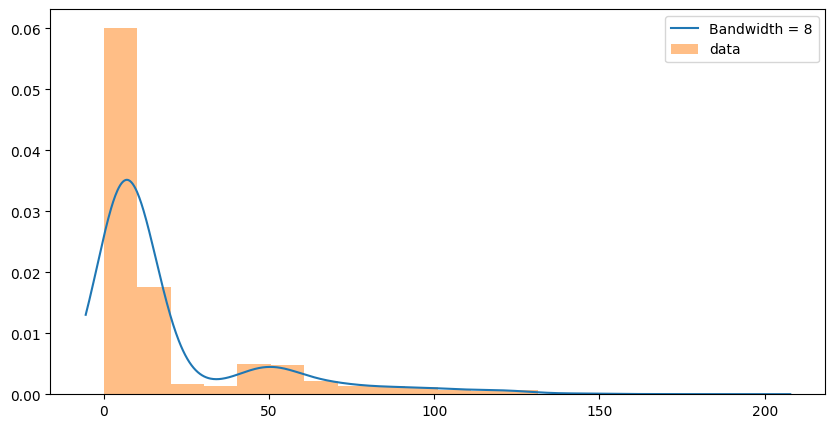

Vertical Distance: 


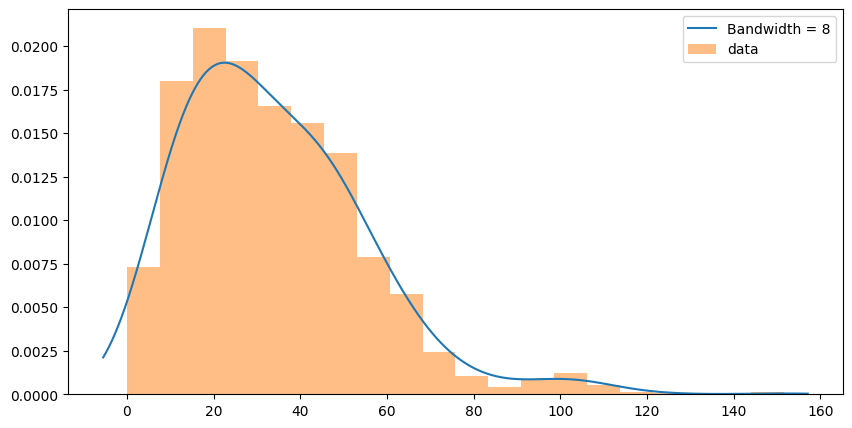

Horizontal Threshold:  28.605072625146747
Vertical Threshold:  60.71608098139092


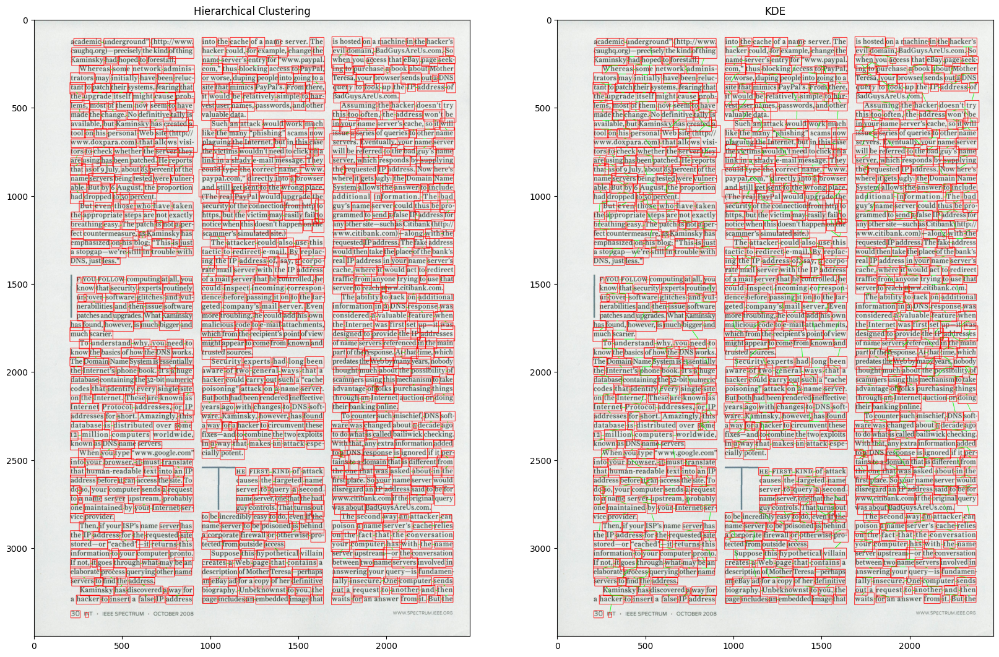

In [168]:
euclidean = set_threshold(df, 20)
image_with_boxes1 = make_connections(img, euclidean)

df = pd.read_csv('CSV/TLBR_250.csv')
df = get_box(df)
euclidean = get_threshold(df, 8)
image_with_boxes2 = make_connections(img, euclidean)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(image_with_boxes1)
plt.title('Hierarchical Clustering')
plt.subplot(1, 2, 2)
plt.imshow(image_with_boxes2)
plt.title('KDE')
plt.show()